# Final Project
Friday May 17th, 2019 at 23:59




In [1]:
# Imports
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import math

# Show Map
import folium
from folium import plugins
from IPython.display import Image

# Word Cloud --> conda install -c conda-forge wordcloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

# Machine learning and visualisation
# training
from sklearn.utils import shuffle
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

# Visualize tree
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus 

# Extract data to json
import json

**Content:**
1. Motivation
    * Data set
* Basic stats 
* Data Analysis
    * Plots
* Genre
* Visualisations
    * Extract Data for Observable
* Discussions
* Contributions
* References

## 1. Motivation
According to [VisitDenmark](https://api.www.visitdenmark.dk/sites/visitdenmark.com/files/2019-05/Turismen%20i%20Danmark%202019.pdf) Denmark is the largest tourist nation in the Nordic countries with a tourism turnover of DKK 108.1 billion and with 12.5 million tourists overnight in Copenhagen every year. But Copenhagen is not known as a cheap city to live in and especially some areas can be quite expensive. With data about Airbnb's entry into Copenhagen, it is possible for us to provide an overview for the tourists about the possibilities of staying overnight in Copenhagen. For example, we will be able to investigate questions like:

- How does the city’s different neighborhoods differ regarding renting an Airbnb residence?
- Is there a pattern between prices, location and rating?
- Where are the highest density of Airbnbs?
- Is there a correlation in price between real estate in Copenhagen and Airbnb residences from the same area?
- Does tourist attraction have an influence on where tourists choose to stay?



**What is your dataset?**<br>
    Our dataset is [Airbnb data](https://public.opendatasoft.com/explore/dataset/airbnb-listings/export/?disjunctive.host_verifications&disjunctive.amenities&disjunctive.features&location=6,52.60972,11.06323&basemap=jawg.streets) about rentable Airbnb's all over the world. The data has been filtered to only include data about Copenhagen and afterwards cleaned. Which resulted in 13 areas, 9509 Airbnb housings divided into 16 types of housing.

  The data specifications are as follows:
  - *Full dataset:*
      * 1.9GB
      * 494.954 rows
      * 90 variables
  - *Copenhagen subdataset:*
      * 67MB <br>
      * 20.548 rows <br>
      * 90 variables
  - *Cleaned Copenhagen data:*
      * 9509 rows
<br>


In addition, we also have a small dataset (79 KB) on [property prices in Copenhagen](https://rkr.statistikbank.dk/statbank5a/SelectVarVal/Define.asp?MainTable=BM011) for comparison.


In [3]:
# Import Copenhagen dataset data
data = pd.read_csv('airbnbDK', sep='\t') 

# Import house prices in Copenhagen
dataEjendomspriser = pd.read_excel('Ejendomspriser.xlsx')

*Import Data*

*To import the full dataset run the code in the following code after importing the data.<br>
This is not active since we only use the data dealing with Copenhagen.*
~~~~
# Import full dataset data
data = pd.read_csv("../../airbnb-listings.csv", sep=';')

# Extract and save Danish Copenhagen Data
dkset = data.loc[data['Country'].str.contains("Denmark", na=False)]
dkset.to_csv("airbnbDK", sep='\t')
~~~~

*A snippet of the main dataset is shown below as well as a full list of all the attributes.*

In [4]:
# Data snippet
data.head(3)

,Unnamed: 0,ID,Listing Url,Scrape ID,Last Scraped,Name,Summary,Space,Description,Experiences Offered,...,Review Scores Communication,Review Scores Location,Review Scores Value,License,Jurisdiction Names,Cancellation Policy,Calculated host listings count,Reviews per Month,Geolocation,Features
0,100,1.32726e+07,https://www.airbnb.com/rooms/13272604,2.017062e+13,2017-06-15,"Centralt, roligt, lyst, hyggeligt og charmerende","85 m2 i 2 plan - tæt på centrum, Frederiksberg...","Det er en charmerende og rummelig lejlighed, s...","85 m2 i 2 plan - tæt på centrum, Frederiksberg...",none,...,10.0,9.0,10.0,NaN,NaN,moderate,1.0,2.16,"55.6952056557, 12.5112931088","Host Has Profile Pic,Is Location Exact"
1,101,6.45647e+06,https://www.airbnb.com/rooms/6456469,2.017062e+13,2017-06-15,Cozy rooms in hyggelig family apartment,Welcome to our home :) We normally rent out 2 ...,Welcome to our home :) Our home is the home of...,Welcome to our home :) We normally rent out 2 ...,none,...,NaN,NaN,NaN,NaN,NaN,flexible,1.0,NaN,"55.6934389006, 12.4917170949","Host Has Profile Pic,Is Location Exact"
2,102,1.47852e+07,https://www.airbnb.com/rooms/14785236,2.017062e+13,2017-06-15,Idyllic CPH Villa Apartment near City Center,Our home will be the perfect choice for you an...,The architecture of our Villa apartment is cla...,Our home will be the perfect choice for you an...,none,...,10.0,6.0,8.0,NaN,NaN,moderate,1.0,0.15,"55.6952347435, 12.5072838591","Host Has Profile Pic,Is Location Exact"


In [5]:
# Dataset attributes
[print(i,"-",data.keys()[i]) for i in range(len(data.keys()))]

0 - Unnamed: 0
1 - ID
2 - Listing Url
3 - Scrape ID
4 - Last Scraped
5 - Name
6 - Summary
7 - Space
8 - Description
9 - Experiences Offered
10 - Neighborhood Overview
11 - Notes
12 - Transit
13 - Access
14 - Interaction
15 - House Rules
16 - Thumbnail Url
17 - Medium Url
18 - Picture Url
19 - XL Picture Url
20 - Host ID
21 - Host URL
22 - Host Name
23 - Host Since
24 - Host Location
25 - Host About
26 - Host Response Time
27 - Host Response Rate
28 - Host Acceptance Rate
29 - Host Thumbnail Url
30 - Host Picture Url
31 - Host Neighbourhood
32 - Host Listings Count
33 - Host Total Listings Count
34 - Host Verifications
35 - Street
36 - Neighbourhood
37 - Neighbourhood Cleansed
38 - Neighbourhood Group Cleansed
39 - City
40 - State
41 - Zipcode
42 - Market
43 - Smart Location
44 - Country Code
45 - Country
46 - Latitude
47 - Longitude
48 - Property Type
49 - Room Type
50 - Accommodates
51 - Bathrooms
52 - Bedrooms
53 - Beds
54 - Bed Type
55 - Amenities
56 - Square Feet
57 - Price
58 - We

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

**Why did you choose this/these particular dataset(s)?**<br>
    When researching datasets for our idea of making a narrative about Airbnb in Copenhagen, we stumbled upon a couple of datasets. The reason why this Airbnb dataset was chosen is the amount of information it contained including the necessary variables for an interesting data analysis and creating a fascinating narrative.<br>
    The property prices dataset from "Realkreditrådets statistik" was the only place where property prices over multiple years were available. After going through the prices and researching the source we found it reliable to use.
<br>

**What was your goal for the end user's experience?**<br>
    The goal was to give reader an insight into Copenhagen though Airbnb in terms of where to find the most suitable accomodations. As a tourist what do they consider important when visting Copenhagen and through that figuring out where to rent a place. This story might additionally help people living in Copenhagen to gain a greater understanding of how to and what to do when listing their place at Airbnb.



*Helping methods used throughout the assignment*

In [6]:
def isfloat(value):
  try:
    float(value)
    return True
  except ValueError:
    return False

In [7]:
# Returns a subset of the data depending on given dates at cateories (type of crime)
def getSubSet(dates, crimes, data):
    subset = []
    for date in dates:
        subset.append(data.loc[data['Date'].str.contains(date)])
    subset = pd.concat(subset)
    result = []
    for crime in crimes:
        result.append(subset.loc[subset['Category'].str.contains(crime)])
    return pd.concat(result)

In [8]:
def df_to_geojson(df, properties, lat='Latitude', lon='Longitude'):
    geojson = {'type':'FeatureCollection', 'features':[], 'totalFeatures':len(df), 'crs':{'type':'airbnb','properties':{'name':"urn:ogc:def:crs:EPSG::4326"}}}
    for _, row in df.iterrows():
        feature = {'type':'Feature',
                   'properties':{},
                   'geometry':{'type':'Point',
                               'coordinates':[]}}
        feature['geometry']['coordinates'] = [float(row[lon]),float(row[lat])]
        for prop in properties:
            feature[prop] = row[prop]
            feature[prop]['District'] = str.encode(str(row[prop]['District'])).decode('utf8')
        geojson['features'].append(feature)
    
    return geojson

## 2. Basic stats
**Write about your choices in data cleaning and preprocessing**<br>
    Our dataset was about Airbnb world wide, so the first step was to filter the dataset to only contain data about Copenhagen. Next the dataset had to be cleaned to assure that no rows were missing necessary data. To do so we removed all rows with missing values required for our analysis using `dropna` on a subset consisting of the key columns. Before cleaning the Copenhagen dataset it contained 20548 rows and after it was about half as big with 9509 rows.

In [9]:
# Data clean up - Remove Nan
dataNotNan = data.dropna(subset=['Price', 'First Review', 'Last Review', 'Latitude', 'Longitude', 'Neighbourhood', 'Host Since',
                                 'Review Scores Rating', 'Review Scores Accuracy','Review Scores Cleanliness','Review Scores Checkin','Review Scores Communication','Review Scores Location',  'Review Scores Value' ])
dataNotNan.reset_index()
print("Data before clean", len(data), "\nData after clean", len(dataNotNan))


Data before clean 20548 
Data after clean 9509


In [10]:
# Data clean up - Remove Nan
before = len(dataEjendomspriser)
for key in dataEjendomspriser.keys()[2:-2]:
    dataEjendomspriser = dataEjendomspriser[pd.to_numeric(dataEjendomspriser[key], errors='coerce').notnull()] 
    
print("Ejendomspriser rows before clean", before, "\nEjendomspriser rows after clean", len(dataEjendomspriser))

Ejendomspriser rows before clean 258 
Ejendomspriser rows after clean 168


**Preparing data**

*Mappings to Copeenhagen districts*

*The main dataset does not contain districts, only neighborhoods, which are slightly smaller. Given that the geoJson data we were able to find only came in districts we manually mapped the neighborhoods to districts. This can be seen below.*
*In addition, we also made a mapped the zipcodes to districts to compare the normal housing prices in a district to airbnb prices.*

In [11]:
# Mapping: Neighbourhoods
cityAreas = {
    'Amager Vest': 'Amager Vest', 'Amagerbro':'Amager Øst','Amager Øst':'Amager Øst', 
    'Brønshøj':'Brønshøj-Husum ','Christianshavn':'Christianshavn', 'Frederiksberg':'Frederiksberg',
    'Holmen':'Indre By', 'Indre By':'Indre By','Islands Brygge':'Amager Vest', 
    'København NV':'Bispebjerg','Kødbyen':'Vesterbro', 'Nyboder':'Østerbro',
    'Nørrebro':'Nørrebro', 'Sluseholmen':'Kongens Enghave',
    'Teglholmen':'Kongens Enghave', 'Valby':'Valby','Vanløse':'Vanløse', 
    'Vesterbro':'Vesterbro', 'Østerbro':'Østerbro', 'Kastrup':'Amager Vest'
}

In [12]:
# Mapping: zipcodes
zipcodeToCityArea = {
    2200 : 'Nørrebro',
    2300 : 'Amager', # Amager øst og vest
    2400 : 'Bispebjerg',
    2450 : 'Kongens Enghave',
    2500 : 'Valby',
    2700 : 'Brønshøj-Husum ',
    2720 : 'Vanløse'
}

zipcodeToCityArea.update(
    dict(zip(range(1000,1500), ['Indre By' for i in range(1000,1500)])))
zipcodeToCityArea.update(
    dict(zip(range(1500,1800), ['Vesterbro' for i in range(1500,1800)])))
zipcodeToCityArea.update(
    dict(zip(range(1800,2001), ['Frederiksberg' for i in range(1800,2001)])))
zipcodeToCityArea.update(
    dict(zip(range(2100,2200), ['Østerbro' for i in range(2100,2200)])))
zipcodeToCityArea.update(
    dict(zip(range(2600,2700), ['Andet' for i in range(2600,2700)])))
zipcodeToCityArea.update(
    dict(zip(range(2730,2901), ['Andet' for i in range(2730,2901)])))


*Adding new Attributes to the dataset*

*We add the following new attributes to the dataset:*
* *Price to nearest 200*
* *District*
* *First Review Month*
* *Last Review Month*

In [14]:
# Round price to nearest 200
dataNotNan.loc[:,'Price to nearest 200'] = [p-p%200 if p%200 < 100 else p+(200-p%200) for p in dataNotNan['Price'].copy().values]
dataNotNan.groupby(['Price to nearest 200']).count()['ID']

Price to nearest 200
0.0          3
200.0      732
400.0     2801
600.0     2797
800.0     2318
1000.0     858
Name: ID, dtype: int64

In [15]:
# Find District
dataNotNan.loc[:,'District'] = [cityAreas[n] for n in dataNotNan['Neighbourhood'].values]
set(dataNotNan['District'])

{'Amager Vest',
 'Amager Øst',
 'Bispebjerg',
 'Brønshøj-Husum ',
 'Christianshavn',
 'Frederiksberg',
 'Indre By',
 'Kongens Enghave',
 'Nørrebro',
 'Valby',
 'Vanløse',
 'Vesterbro',
 'Østerbro'}

In [16]:
dataNotNan.loc[:,'First Review Month'] = [fr[:7] for fr in dataNotNan['First Review'].values]
dataNotNan.loc[:,'Last Review Month'] = [lr[:7] for lr in dataNotNan['Last Review'].values]

**Write a short section that discusses the dataset stats, containing key points/plots from your exploratory data analysis.**<br>

With 90 columns and 20.500 rows the Airbnb dataset is pretty large which is always nice to work with. to gain an overviw of the data we started out by creating a colored map of the data to get an idea of how it is structured. Given the color coded prices and the location it seems like there could be a significant ratio between these attributes.


In [17]:
def addCrimeLocationsColors(m, fgv, colors, data):
    for bnb in data.values:
        if(isfloat(bnb[46]) and isfloat(bnb[47]) and str(bnb[47]) != 'nan'):
            fgv.add_child(folium.CircleMarker(
                location=[float(bnb[46]), float(bnb[47])], 
                radius = 1,
                fill=False, 
                color = colors[int(bnb[90]/200)], 
                fill_opacity=0.5))
    
    m.add_child(fgv)
    return m

In [18]:
m = folium.Map([55.679698, 12.550467], zoom_start=12)
fgv = folium.FeatureGroup(name="Locations")
colors = ['yellow','green','cadetblue','orange','red','purple']

m = addCrimeLocationsColors(m, fgv, colors, dataNotNan)

m.add_child(folium.LayerControl())
m.save(outfile= "locationsPriceColors.html")
#Image("locationsPriceColor.png")
m

Now, lets look closer at these prices. We see that the renting price for an Airbnb accommodation per night is typically between 300-900 DKK, where 500 DKK is the most usual price. We can se that it is common to set the price to modulo 100 is zero.

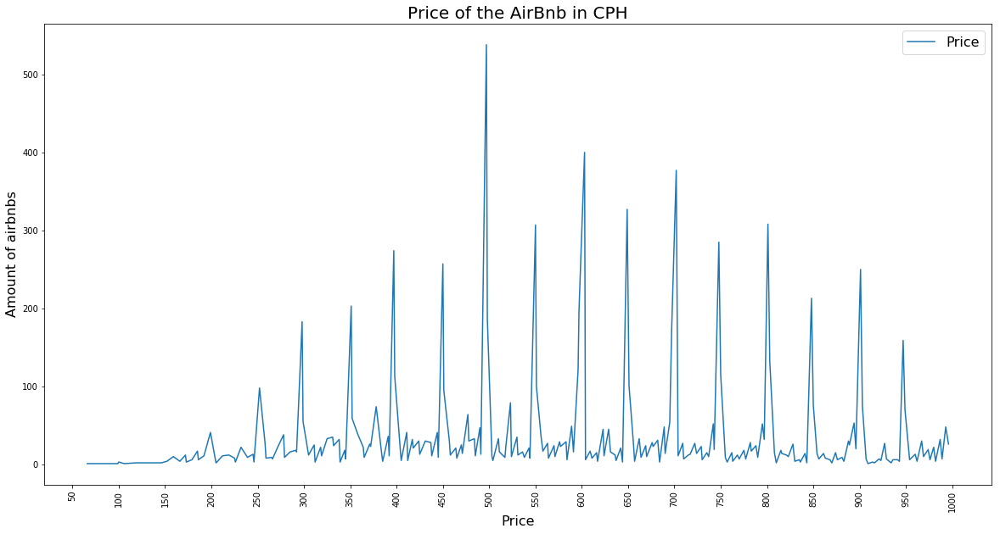

In [19]:
plt.figure(figsize=(20,10))
dataP = dataNotNan.groupby('Price')['ID'].count()

minP = min(dataP.keys())-min(dataP.keys())%50
maxP = max(dataP.keys())+50

plt.plot(dataP.keys(), dataP.values)

plt.xticks(np.arange(minP, maxP, 50.0), rotation='vertical')
plt.legend(['Price'], fontsize=16)
plt.xlabel('Price', fontsize=16)
plt.ylabel('Amount of airbnbs', fontsize=16)
plt.title('Price of the AirBnb in CPH', fontsize=20)
plt.savefig('pris.png')
plt.show()

In the plot below we see that the amount of first and last reviews peak in the summer every year. This has probably something to do with people in general being more likely to travel in the summer time and therefore we also see that people review more in that time period. Simply because there is more activity. 

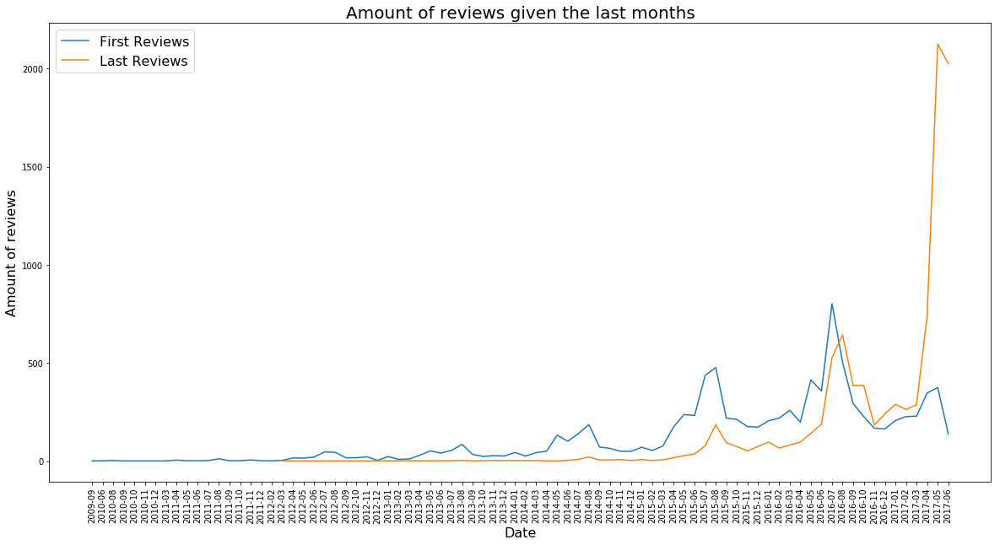

In [20]:
firstReviewData = dataNotNan.groupby('First Review Month').count()['ID']
lastReviewData = dataNotNan.groupby('Last Review Month').count()['ID']

plt.figure(figsize=(20,10))
plt.plot(firstReviewData.keys(), firstReviewData.values)
plt.plot(lastReviewData.keys(), lastReviewData.values)

plt.xticks(range(len(firstReviewData)), firstReviewData.keys(), rotation='vertical')
plt.legend(['First Reviews','Last Reviews'], fontsize=16)
plt.xlabel('Date', fontsize=16)
plt.ylabel('Amount of reviews', fontsize=16)
plt.title('Amount of reviews given the last months', fontsize=20)
plt.savefig("reviews.png")
plt.show()

Another interesting aspect of the dataset is the ratings. Given the data we have plotted boxplots of the ratings given the available categories. Here we disover that Airbnb-guests nearly always rate the places/hosts they visit with the highest rating, 10, on all parameters. Unfortunately, this is properly not because all Airbnb rentals are actually perfect. This is a tendency we see in other rating-based services as well. For example, we also see [this inflation in top ratings with the taxi's counterpart to Airbnb, Uber](https://qz.com/1244155/good-luck-leaving-your-uber-driver-less-than-five-stars/). One could suspect that the guests and the hosts often make a gentleman's agreement on giving each other top ratings. 

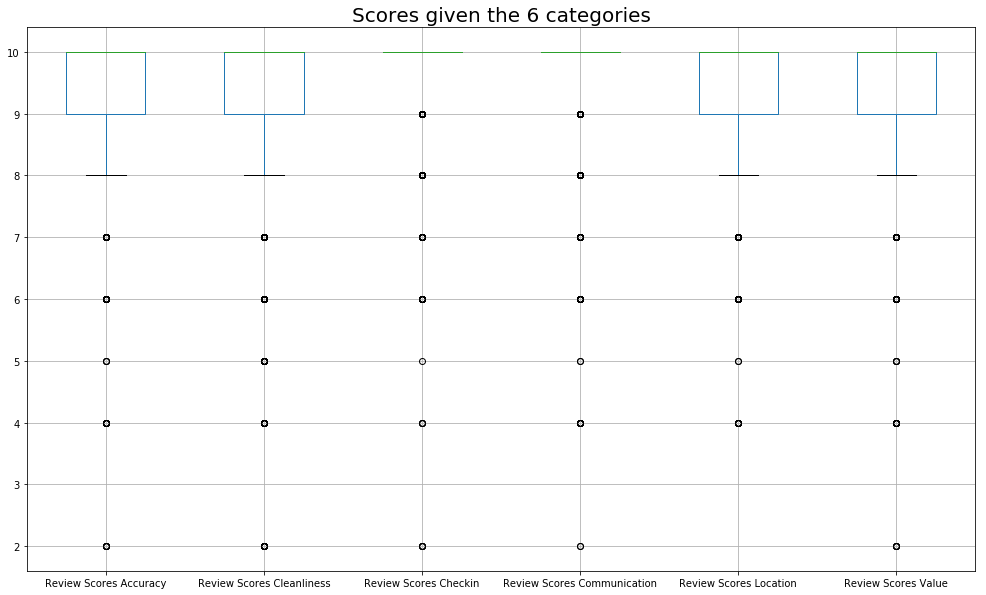

In [21]:
df = pd.DataFrame(data = dataNotNan, columns = ['Review Scores Accuracy','Review Scores Cleanliness','Review Scores Checkin','Review Scores Communication','Review Scores Location','Review Scores Value'])

bp = df.boxplot(figsize=(17,10))
plt.title("Scores given the 6 categories", fontsize=20 )

plt.savefig("boxplot.png", format="png")
plt.show()

Now for the genereal property prices in copenhagen. Here the dataset is given by zipcodes. For the dataset regarding property prices in Copenhagen, we simply see that the price developments for the housing market has been rising in the past five years.

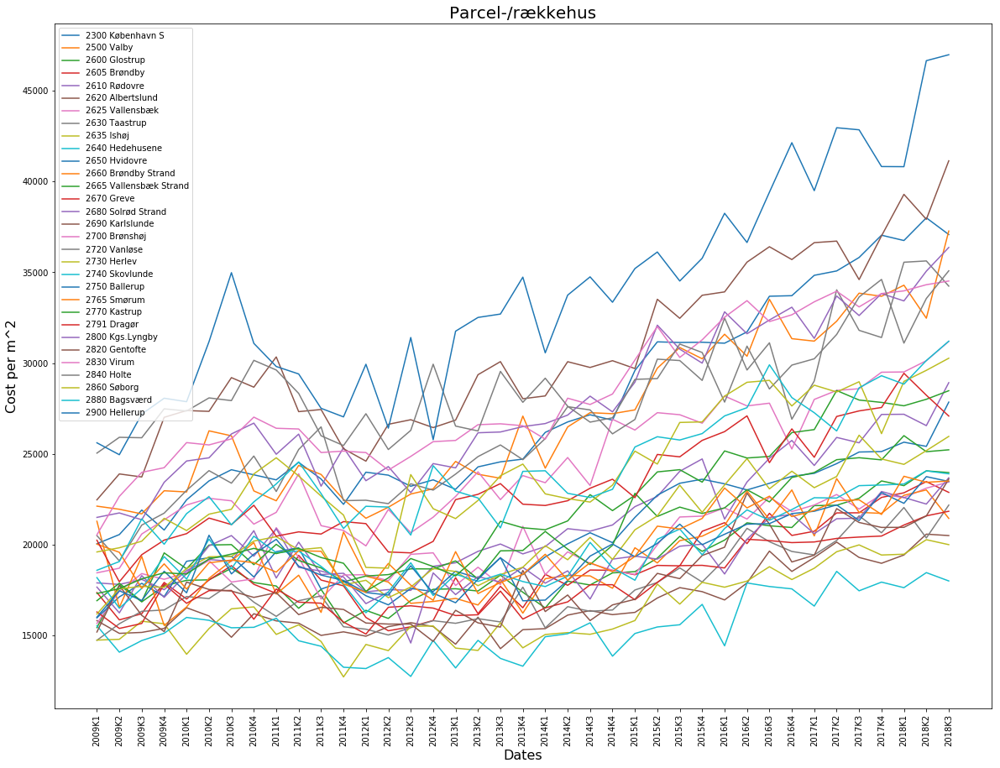

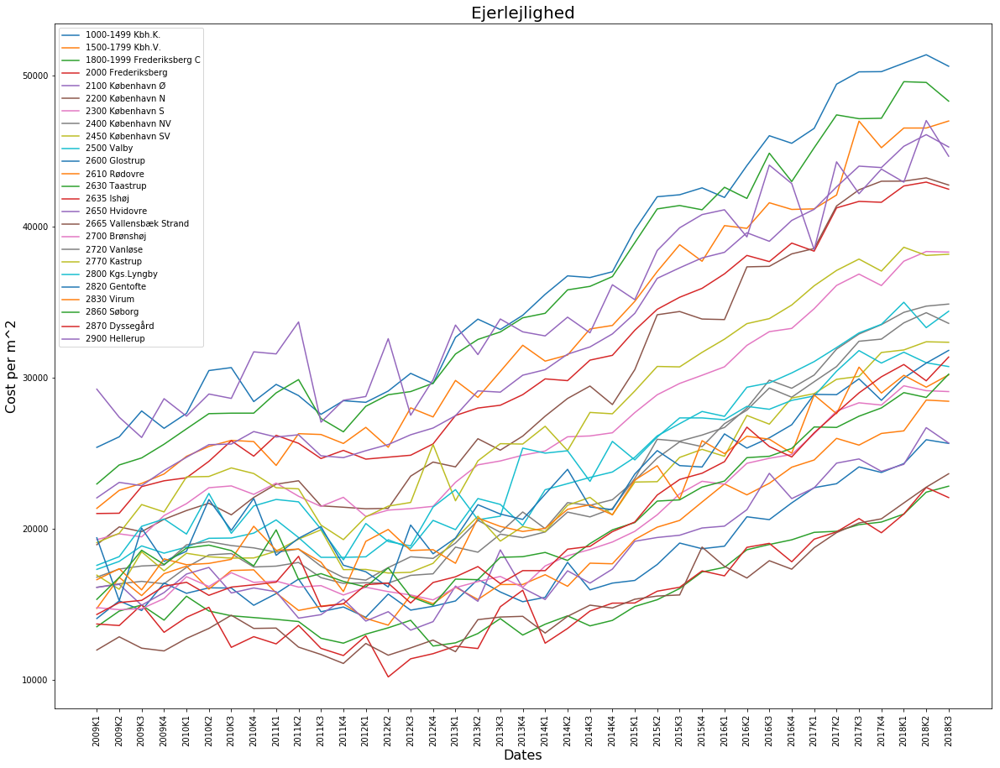

In [22]:
dataPrice = dataEjendomspriser.loc[dataEjendomspriser['Type Pris'].str.contains('Realiseret handelspris')]

for typeHouse in set(dataPrice['Type Hus']):
    subset = dataPrice.loc[dataPrice['Type Hus'].str.contains(typeHouse)]

    legends = []

    plt.figure(figsize=(20,15))
    for row in subset.values:
        temp = [r for r in row[2:41] if r != '..']
        if len(temp) == 39:
            plt.plot(temp)
            legends.append(row[1])

    plt.legend(legends)
    plt.title(typeHouse, fontsize=20)
    plt.xlabel('Dates', fontsize=16)
    plt.ylabel('Cost per m^2', fontsize=16)
    plt.xticks(range(39),subset.keys()[2:41], rotation='vertical')
    plt.show()

## 3. Data Analysis

**Describe your data analysis and explain what you've learned about the dataset.**<br>

In addition to simply looking at the generated graphs, we would like to discover how much the given attributes actually have in common. Can location predict the price?

We decided to make a decission tree to see wether the attributes can become predictable.

In [23]:
def toInteger(dirc, value):
    return dirc[value]

To make the decission tree we can only use integers, and will therefor map some parameters to floats. 


In [24]:
districtMap = {'Indre By': 1,'Christianshavn': 2,'Vesterbro': 3,
               'Frederiksberg':4,'Nørrebro': 5,
               'Østerbro': 6,'Amager Øst': 7,
               'Amager Vest': 8, 'Kongens Enghave': 9,
               'Valby': 10, 'Vanløse': 11,
               'Bispebjerg': 12, 'Brønshøj-Husum ': 13}

In [25]:
propertyTypeMap = {
    'Other': 1, 'Tent': 2,
    'Boat': 3, 'Camper/RV': 4,
    'Dorm': 5, 'Loft': 6,
    'Cabin': 7, 'Bed & Breakfast': 8,
    'Boutique hotel': 9, 'Apartment': 10,
    'Condominium': 11, 'Guesthouse': 12,
    'Treehouse': 13, 'Townhouse': 14,
    'House': 15, 'Villa': 16}

In [26]:
cancellationPolicyMap = {'flexible': 1,'moderate': 2, 'strict': 3}

In [27]:
def getLen(x):
    try:
        float(x)
        return 0
    except ValueError:
        return len(x)
    
def getInt(x):
    try:
        int(str(x)[:4])
        return int(str(x)[:4])
    except ValueError:
        return 0

def nanToZerofloat(x):
    if isfloat(x):
        return nanTozero(float(x))
    else:
        try:
            float(x)
            print(x, type(x))
            return nanTozero(float(x))
        except ValueError:
            print(x, type(x))
            return 0.0

def nanTozero(x):
    if math.isnan(x):
        return 0.0
    else:
        return float(x)

The chosen attributes the decission tree is listed in *chosenAttributes*

In [28]:
chosenAttributes = ['House Rules','Host ID', 'Host Since', 
                    'Host Response Rate', 'Zipcode', 
                    'District','Property Type','Accommodates', 
                    'Bathrooms', 'Bedrooms', 'Beds', 'Square Feet', 
                    'Weekly Price', 'Monthly Price',
                    'Security Deposit','Cleaning Fee',
                    'Guests Included','Extra People',
                    'Minimum Nights','Maximum Nights',
                    'Has Availability','Availability 30',
                    'Availability 60','Availability 90',
                    'Availability 365','Number of Reviews',
                    'Review Scores Rating','Review Scores Accuracy',
                    'Review Scores Cleanliness','Review Scores Checkin',
                    'Review Scores Communication','Review Scores Location',
                    'Review Scores Value','Cancellation Policy',
                    'Calculated host listings count','Reviews per Month']

result = 'Price to nearest 200'

In [29]:
treeInput = dataNotNan[chosenAttributes]
treeOutput = dataNotNan[result]

*Preprocessing the data to floats*

In [30]:
# change input data
treeInput.loc[:,'House Rules'] = treeInput.loc[:,'House Rules'].apply(lambda x: getLen(x))
treeInput.loc[:,'Host Since'] = treeInput.loc[:,'Host Since'].apply(lambda x: int(''.join(c for c in x if c.isdigit())))
treeInput.loc[:,'Zipcode'] = treeInput.loc[:,'Zipcode'].apply(lambda x: getInt(x))
treeInput.loc[:,'Property Type'] = treeInput.loc[:,'Property Type'].apply(lambda x: toInteger(propertyTypeMap,x))
treeInput.loc[:,'Cancellation Policy'] = treeInput.loc[:,'Cancellation Policy'].apply(lambda x: toInteger(cancellationPolicyMap,x))
treeInput.loc[:,'District'] = treeInput.loc[:,'District'].apply(lambda x: toInteger(districtMap,x))

temp = ['House Rules','Host Since','Zipcode','Property Type','Cancellation Policy','District']

for key in treeInput.keys():
    if key not in temp:
        treeInput.loc[:,key] = treeInput.loc[:,key].apply(lambda x: nanToZerofloat(x))



/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [31]:
def plotTree(dtree):
    dot_data = StringIO()
    export_graphviz(dtree, 
                    out_file=dot_data,  
                    filled=True, rounded=True,
                    special_characters=True)

    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
    return Image(graph.create_png())

In [32]:
gini_max = [0,0]
entropy_max = [0,0]
for i in range(1,15):
    clf_gini = DecisionTreeClassifier(criterion = "gini", max_depth=i)
    cv_results = cross_validate(clf_gini, treeInput, treeOutput, cv=10, return_train_score=False)
    
    if np.mean(cv_results['test_score']) > gini_max[0]:
        gini_max[0] = np.max(cv_results['test_score'])
        gini_max[1] = i
    
    clf_entropy = DecisionTreeClassifier(criterion = "entropy", max_depth=i)
    cv_results = cross_validate(clf_entropy, treeInput, treeOutput, cv=10, return_train_score=False)
    if np.mean(cv_results['test_score']) > entropy_max[0]:
        entropy_max[0] = np.max(cv_results['test_score'])
        entropy_max[1] = i

print("The best test score for Gini is %.2f%% with max depth %d" % (gini_max[0]*100,gini_max[1]))
print("The best test score for Entropy is %.2f%% with max depth %d" % (entropy_max[0]*100,entropy_max[1]))



/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 3 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)
/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 3 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)
/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 3 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)
/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:652: Warning: The least populated class in y has only 3 members, which is too few. The minimum number 

The best test score for Gini is 43.44% with max depth 3
The best test score for Entropy is 43.13% with max depth 3


We try to fit a decision tree to 36 attributes which have been listed in chosenAttributes.
The inted is to predict the price class of airbnb housings. 

The some attributes of the data are roughly convereted to floats to initially get a idea of which values have most in common with given price class. 

As seen above, only 4-5 different attributes can categorize the data into the price-classes with ony ~41% accuracy. This shows that there are some proportional attributes, such as 'Accommodates', 'Zipcode', 'Bedrooms', 'Cleaning Fee', and some sort of 'Availability' attribute. The results make good sence when looking at them:
* Accommodates: If the airbnb can accommodate many, the overall price is higher given more poeple to pay.
* Zipcode: The area from where the airbnb is placed influence the price because of transportation etc.
* Bedrooms: More bedrooms, more poeple it can house
* Cleaning Fee: ekstra fee to the cost, or perhaps a percentage of the rental price
* Availability: The more available the higher price, which is a bit interesting, though perhaps this attribute tells something about the host's experience in the field.

However given the decision tree it seem as many of the other attributes does not seem to have mutch in common with the airbnb's price class, as the optimal depth is calculated to be 3.

It should be mentioned that some attributes are norminal, these values should be 1-of-k encoded, however have simply been mapped to an integer given the best of our intentions. Attributes such as 'Host ID', 'District', and 'Property Tupe' should be 1-of-k encoded since the actual value of the integer does not influence the order. This may result en a slightly worse accuracy, as they may have a greater influence, though due to the small accuracy and the many 'nan' values in the dataset, we have chosen to conclude our descision tree descovery.



The accuracy of gini with a max depth of 3 is 41.75% 


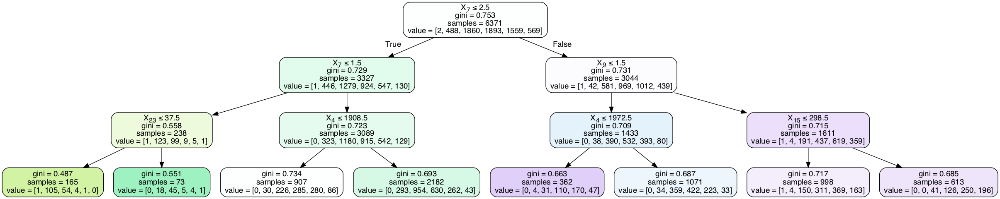

In [34]:
# devide data
X_train, X_test, y_train, y_test = train_test_split(treeInput, treeOutput, test_size=0.33)

# recreate the best model
clf_gini = DecisionTreeClassifier(criterion = "gini", max_depth=3)
dtree_gini = clf_gini.fit(X_train, y_train) 

# predicting
y_pred = dtree_gini.predict(X_test)
print("The accuracy of gini with a max depth of 3 is %.2f%% " % 
      (accuracy_score(y_test, y_pred)*100))

# plot the best model *
plotTree(dtree_gini)

## 4. Genre

**Which genre of data story did you use?**<br>
The genre of choice for our project is the *Partitioned Poster*, which is a multi view visualization narrative without any order. We chose this way of communicating our narrative because the narrative doesn't need to take the reader by the arm for the reader to understand the project. Instead it gives the reader the possibility to explore the aspects they find most interesting, while still getting the full experience by interacting with the explanatory text telling the story.

**Which tools did you use from each of the 3 categories of Visual Narrative (Figure 7 in Segal and Heer). Why?**<br>
- *Visual structuring*: <br>
    * **Consistent Visual Platform**: When exploring our map of Copenhagen by selecting different options we've maintained the layout while only the content of the map changes. This way it's easier to detect any changes.
    <br>
- *Highlighting*: <br>
    * **Zooming**:  We chose to include the option to zoom in on a particular neighbourhood and get closer to the individual neighbourhood for the purpose of seeing the distribution of Airbnb's more accurately placed on the map. It's not only interesting to see the distribution in Copenhagen but also the distribution up close in individual parts of Copenhagen. <br>
    <br>
- *Transition Guidance*: <br>
    * **Animated Transitions**: To make the zooming more pleasant to watch an animated transition has been added. This makes it look like the district moves up hovering over Copenhagen. In addition, it also makes it more clear which district is chosen as a fast cut could create confusion.

**Which tools did you use from each of the 3 categories of Narrative Structure (Figure 7 in Segal and Heer). Why?**<br>
- *Ordering*: <br>
    * **Random Access**: We don't have a chronological order through our narrative, so the reader must choose their own path and navigate through the project which is why the ordering of our project is Random Access.
    <br>
- *Interactivity*: <br>
    * **Filtering** / **Selection** / **Search**: Our map of Copenhagen has the options of selecting different filters to investigate different aspects of the Airbnb activities in the city. The reason for this is to give the reader an opportunity to delve into what they might find fascinating.
    * **Hover Highlighting / Details**: To view the exact number from the option "Color District" in the Observable on each district in Copenhagen it's possible to hover over each district to expose an info box floating above the selected district. In addition detail residing permanently underneath the map, which keeps the visualization cleaner to look at, but still informative when hovering over each district. This gives the user the opportunity to get some details on demand.
    * **Stimulating Default Views**: The observable map has a default value describing the overall average price and total amount of airbnb's in copenhagen. These change as you click around, though will return to the default when clicking on the background. 
    <br>
- *Messasing*:  <br>
    * **Captions / Headlines**: To give the poster some structure to guarantee that the reader understands the elements of the poster headlines and captions have been added.
    * **Introductory Text**: As mentioned eariler we don't have a chronological order through our narrative which is why the reader will be met by an introduction to the experience of Airbnb's in Copenhagen before going exploring through the poster.
    * **Annotations**: To describe the word cloud.
    * **Summary / Synthesis**: The visualisation concludes with an explanitory text of some descoveries in the visualisation and adding some additional information to highlight the important points.



## 5. Visualizations
**Explain the visualizations you've chosen.**<br>
**Map of Copenhagen**:<br>

* The map shows each district in Copenhagen and the available Airbnb accomodation at the time when the data was scraped. In this visualization the average price/count/average house price, based on the filter option "Category District", of Airbnb's in each district is represented by a scale of colors. When hovering over each district the value determined by the category will be presented for the user. The acommodations is shown by small dots with a color representing the price also by a color scale. When clicking on a district the district will zoom in and appear larger giving a more deatiled placement of the acommodations.
* There are three possible options of filtering this map, which is the color of the map.
    - **Color district**: The *Average price* Airbnb price is the standard view and from here you can choose *Count* which shows the number of Airbnb listings in each district and lastly, there is the option *Average house price* which shows the average price for houses in the different districts.
    - **Chose property type**: When renting an Airbnb there are 16 different kinds of accomodation such as single room, apartment, house, tent, boat and so on. This dropdown menu makes it possible to filter and see individual types.
    - **Color Airbnb prices**: This is the option of coloring the dots showing Airbnb placements in Copenhagen by either their price or property type. <br>
<br>


**Wordclouds**: A wordcloud is a weighted representation of the most prominent words occuring in a piece or multiple pieces of analyzed text. Our wordclouds are based on all acommodation descriptions/summaries for each district. These include different words based on which district they belong to and what facilities, transportation possiblities or tourist attractions they are close to and also indicate what type of accomodation is the most common in each district.
<br>


In [35]:
# all text
text = ' '.join([s for s in dataNotNan['Summary'].values if not isfloat(s)])

# text for all neighbourhood in a list
districtList = dataNotNan['District'].unique()

textList = []
for district in districtList: 
    subset = dataNotNan.loc[dataNotNan['District'] == district]
    text = ' '.join([s for s in subset['Summary'].values if not isfloat(s)])
    textList.append(text)


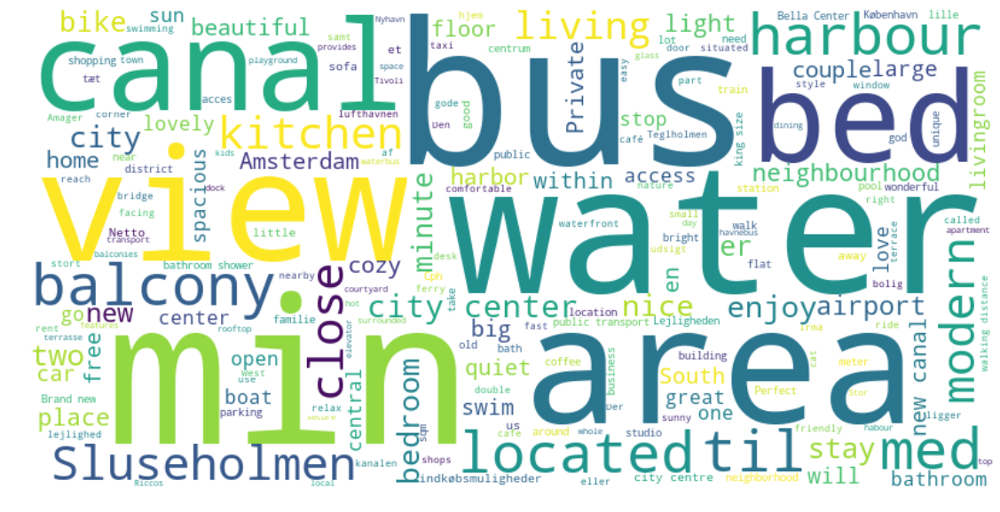

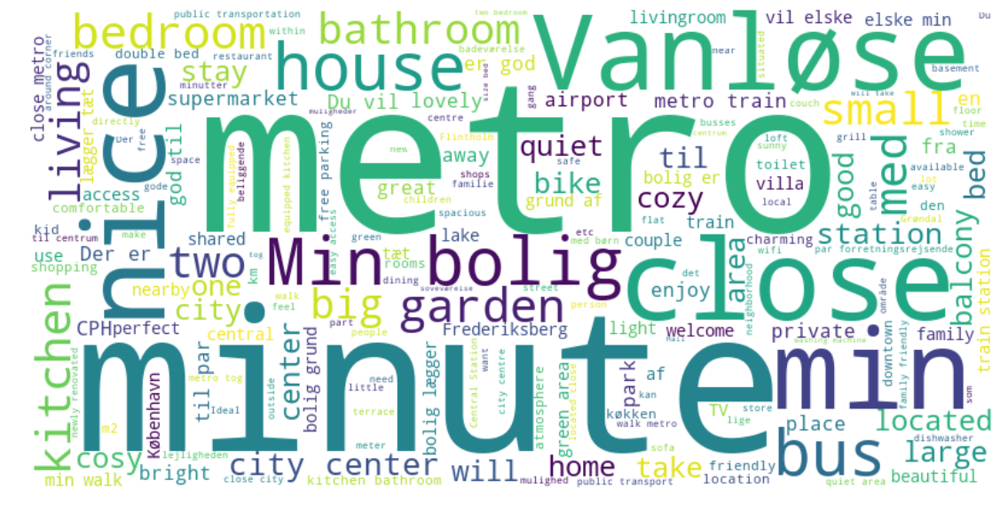

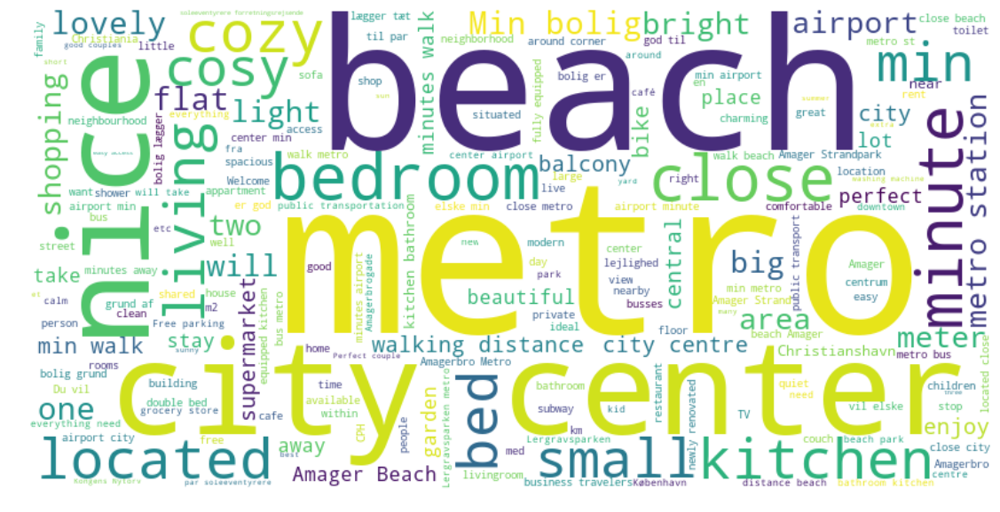

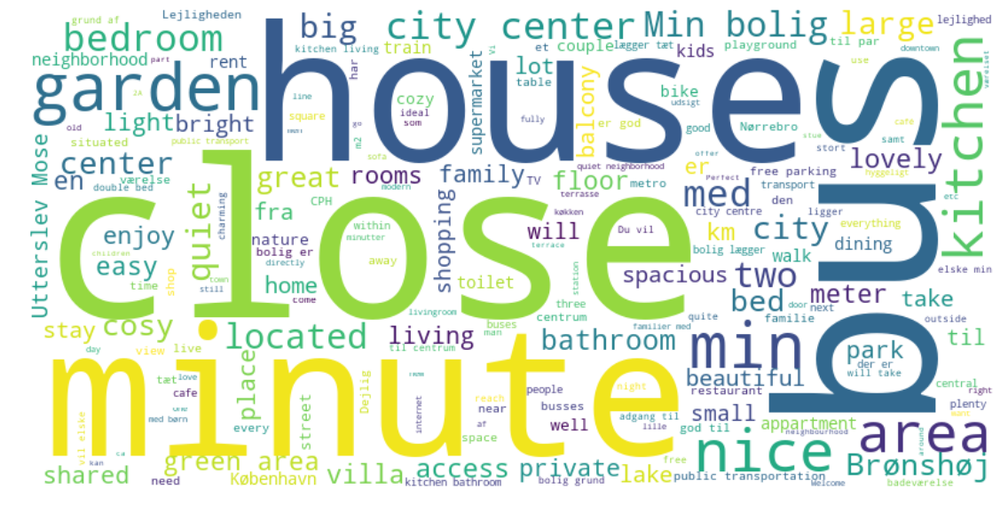

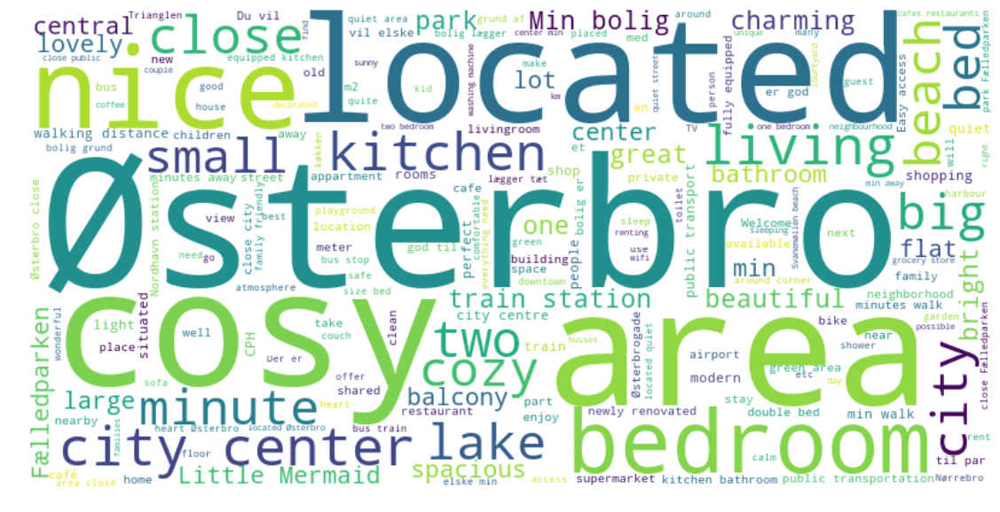

...

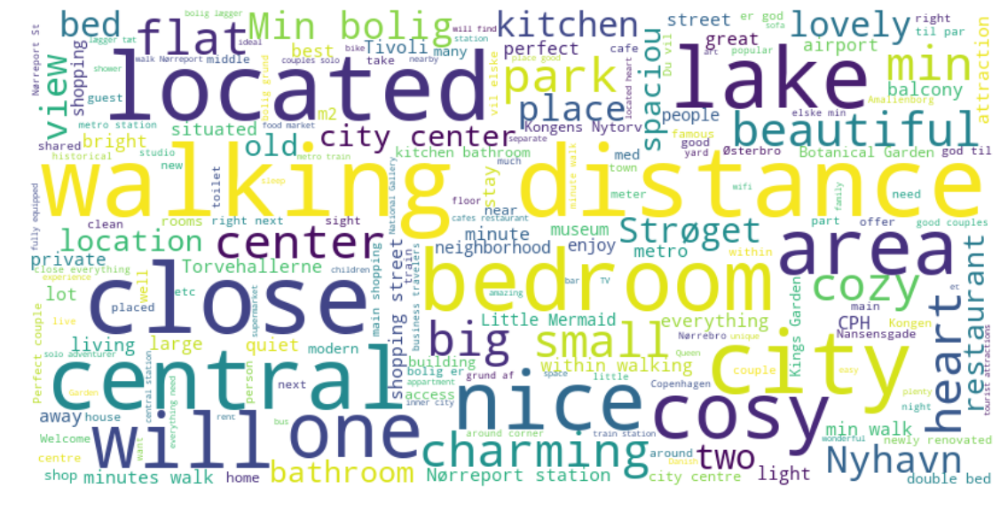

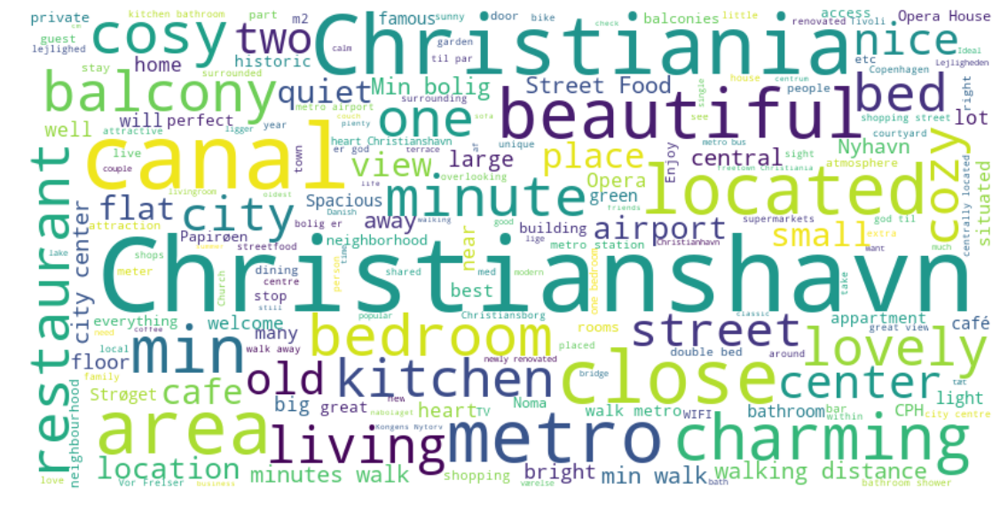

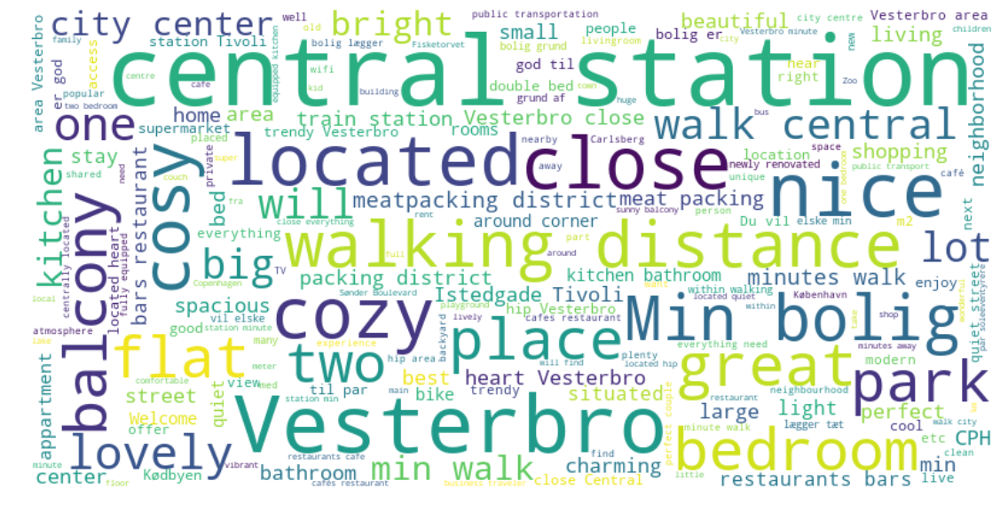

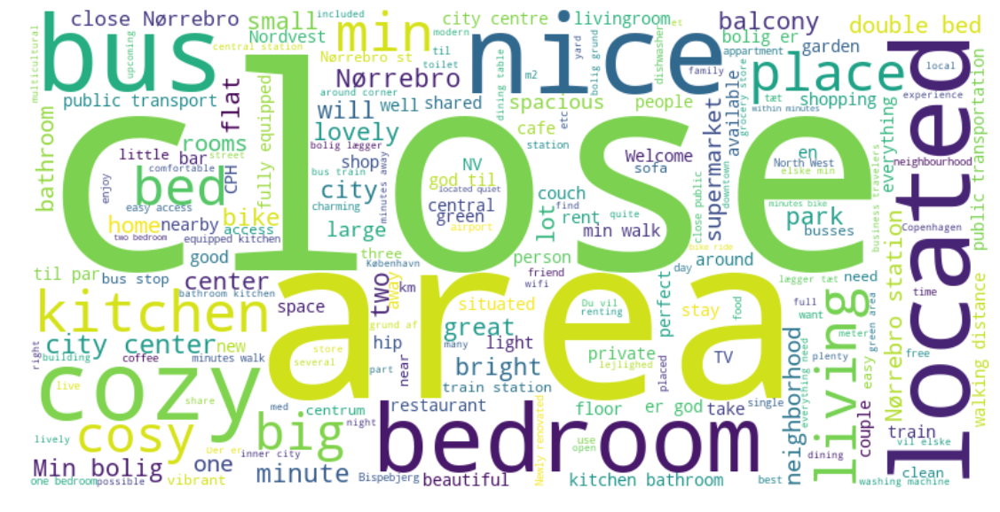

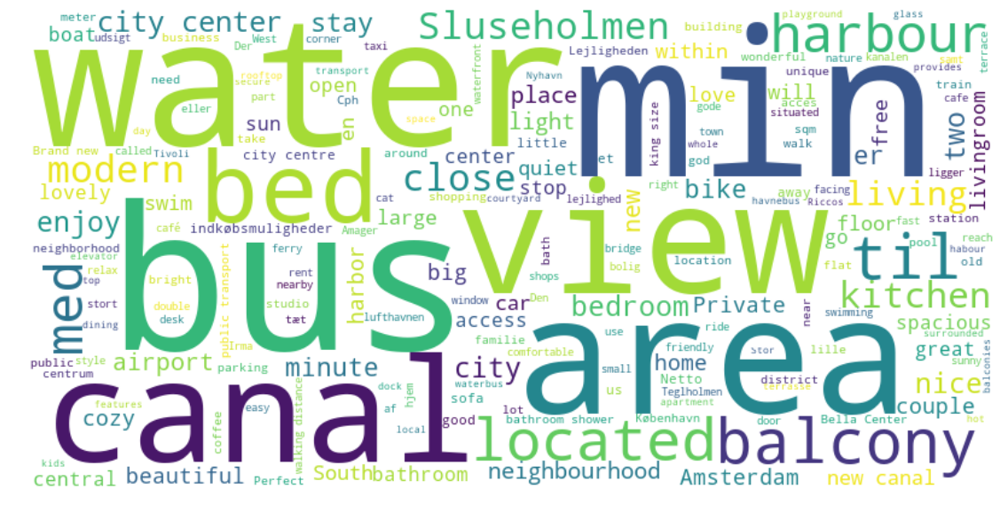

In [37]:
# set some danish and english stopwords
stopwordsCPH = ["og", "på", "apartment", "Copenhagen", "room"] + list(STOPWORDS)

# generate one big default wordcloud with all neighbourhood summaries
wordcloudAll = WordCloud(width=800, height=400, stopwords = stopwordsCPH, background_color="white").generate(district)

# Display and save the generated image:
# the matplotlib way:
plt.figure(figsize=(20,10))
plt.imshow(wordcloudAll, interpolation='bilinear')
plt.axis("off")
plt.savefig('wordcloud_default.png', bbox_inches='tight')
plt.show()



# generate and save wordclouds for all neighbourhoods
i = 0
for district in textList:
    wordcloud = WordCloud(width=800, height=400, stopwords = stopwordsCPH, background_color="white").generate(district)
    
    # Display the generated image:
    # the matplotlib way:
    plt.figure(figsize=(20,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.savefig('wordcloud_' + districtList[i] + '.png', bbox_inches='tight')
    i += 1
    plt.show()


If you take a look at the summaries for the rentals in each neighborhood, you will see from the generated wordclouds that, as expected from a selling text, all words are either positive or neutral. The most common words are not surprisingly "apartment", "Copenhagen" and the famous danish concept "cozy", but also words describing the area, such as "metro" for neighborhoods with a subway station, "canal" for neighborhoods close to the canals, "Christiania" for Christianshavn, "Kødbyen" for Vesterbro or "Opera" for Holmen. 

**Why are they right for the story you want to tell?**<br>
As our project is about the city Copenhagen a map is a must. Furthermore the project is about listings on Airbnb in Copenhagen which is why the map showing these is even more essential to get a feel of the activity in Copenhagen. <br>

When renting an Airbnb it's important to make sure that the listing isn't a scam and that it will be a nice experience staying there so the three important factors to take into account are reviews, price tag and rating of the accomodations, we give an overall idea of how acommodation in Copenhagen performs.<br>

Copenhagen is a small town, but they all differ from each other. To get an insight into accomodation and the area of each district Wordclouds are perfect for describing the most outstanding and common pieces of information.<br>

Copenhagen is also an expensive city to live in, so it's interesting to study whether the average real estate price of the districts reflects the average Airbnb prices of the district.

### Extract Data for Observable

#### District Attributes (Average price / Count)

In [38]:
# Find price per district
districtAirbnb = dataNotNan.groupby(['District'])['Price'].sum().reset_index()

# Find number of Airbnb per district
countAirbnbDistrict = dataNotNan.groupby('District').count()['ID']

In [39]:
dataEjendomspriser.loc[:,'District'] = [zipcodeToCityArea[z] for z in dataEjendomspriser['Postnummer'].values]
districtEjendom = dataEjendomspriser.groupby(['District'])['2018K4'].sum().reset_index()

amager = districtEjendom.loc[districtEjendom['District']=='Amager']['2018K4'].values[0]
indreBy = districtEjendom.loc[districtEjendom['District']=='Indre By']['2018K4'].values[0]
districtEjendom = districtEjendom.append({'District':'Amager Vest', '2018K4':amager}, ignore_index=True)
districtEjendom = districtEjendom.append({'District':'Amager Øst', '2018K4':amager}, ignore_index=True)
districtEjendom = districtEjendom.append({'District':'Christianshavn', '2018K4':indreBy}, ignore_index=True)


In [40]:
countEjendomDistrict = dataEjendomspriser.groupby('District').count()
countEjendomDistrict = countEjendomDistrict['Navn'].reset_index()

amager = countEjendomDistrict.loc[countEjendomDistrict['District']=='Amager']['Navn'].values[0]
indreBy = countEjendomDistrict.loc[countEjendomDistrict['District']=='Indre By']['Navn'].values[0]

countEjendomDistrict = countEjendomDistrict.append({'District':'Amager Vest', 'Navn':amager}, ignore_index=True)
countEjendomDistrict = countEjendomDistrict.append({'District':'Amager Øst', 'Navn':amager}, ignore_index=True)
countEjendomDistrict = countEjendomDistrict.append({'District':'Christianshavn', 'Navn':indreBy}, ignore_index=True)


In [41]:
# combine data
districtAirbnb['District'] = [str.encode(str(d)).decode('utf8') for d in districtAirbnb['District'].values]
districtAirbnb['Count'] = [countAirbnbDistrict[d] for d in districtAirbnb['District'].values]
districtAirbnb['Average price'] = districtAirbnb['Price']/districtAirbnb['Count']
districtAirbnb['Average house price'] = [(districtEjendom.loc[districtEjendom['District']==d]['2018K4'].values[0]
                                        /countEjendomDistrict.loc[countEjendomDistrict['District']==d]['Navn'].values[0])
                                        for d in districtAirbnb['District'].values]
districtAirbnb


,District,Price,Count,Average price,Average house price
0,Amager Vest,445734.0,737,604.795115,39639.500000
1,Amager Øst,378613.0,669,565.938714,39639.500000
2,Bispebjerg,265545.0,553,480.189873,33671.666667
3,Brønshøj-Husum,75293.0,152,495.348684,31547.166667
4,Christianshavn,143040.0,208,687.692308,50634.000000
5,Frederiksberg,719984.0,1150,626.073043,45733.000000
6,Indre By,540470.0,767,704.654498,50634.000000
7,Kongens Enghave,35501.0,58,612.086207,40487.333333
8,Nørrebro,1259272.0,2159,583.266327,42867.333333
9,Valby,194147.0,376,516.348404,36170.666667


In [42]:
price = np.sum([districtEjendom.loc[districtEjendom['District']==d]['2018K4'].values[0] for d in districtAirbnb['District'].values])
count = np.sum([countEjendomDistrict.loc[countEjendomDistrict['District']==d]['Navn'].values[0] for d in districtAirbnb['District'].values])
  
price/count

40445.54385964912

In [43]:
output_filename = 'airBnbDistrictData.json'
districtAirbnb.set_index('District').to_json(output_filename)

#### Airbnb places as geojson (individual locations)

In [44]:
# Find Airbnb places with properties
airbnbPlaces = dataNotNan.filter(['Latitude','Longitude'], axis=1)
#airbnbPlaces.to_csv("locationAndPrice.csv")
print(len(airbnbPlaces))

airbnbPlaces['properties'] = [row.to_dict() for idx, row in dataNotNan.filter(['Price','Property Type','District'], axis=1).iterrows()]
airbnbPlaces.head(5)


9509


,Latitude,Longitude,properties
0,55.695206,12.511293108812785,"{'Price': 649.0, 'Property Type': 'Apartment',..."
2,55.695235,12.507283859127154,"{'Price': 510.0, 'Property Type': 'Villa', 'Di..."
3,55.664765,12.614418747491374,"{'Price': 697.0, 'Property Type': 'Apartment',..."
6,55.656692,12.609505449062533,"{'Price': 644.0, 'Property Type': 'Apartment',..."
12,55.701262,12.474425857466034,"{'Price': 544.0, 'Property Type': 'House', 'Di..."


In [45]:
geojson = df_to_geojson(airbnbPlaces, ['properties']) 

output_filename = 'aitbnbPlaces.json'
with open(output_filename, 'w') as output_file:
    #output_file.write('var dataset = ')
    json.dump(geojson, output_file, indent=2, ensure_ascii=False)

In [46]:
# Load data again
# with open(output_filename) as json_file:  
#    data = json.load(json_file)
#data
set(dataNotNan['Property Type'].values)

{'Apartment',
 'Bed & Breakfast',
 'Boat',
 'Boutique hotel',
 'Cabin',
 'Camper/RV',
 'Condominium',
 'Dorm',
 'Guesthouse',
 'House',
 'Loft',
 'Other',
 'Tent',
 'Townhouse',
 'Treehouse',
 'Villa'}

## 6. Discussion 

**What went well?**<br>
The overview given by the districts of Copenhagen went well. It created a nice flow to the data and made it much easier to understand. We were also proud of the word cloud based of both danish and english summaries. (*Sorry to all the english readers out there who do not speak danish*). We expected a lot of danish stopwords to become a part of the final product, though they give a nice overview of what a given district is represented by. 

**What is still missing? What could be improved?, Why?**<br>
When starting the project we should have been more critical about the data attrributes and removed the columns that we didn't need. This would have made it easier to see what we had to work with, instead ia became a bit overwhelming with the many possibilities from the attributes.

The narritive of our visualisation is not as strong as we had hoped as e.g. the rating didn't give much information, as all were hoped for. It became a bit of a barrier as the initial idea was to discover the attributes of the highest rated places.

When drawing all the airbnb places on the d3 map it starts to lag. This is due to the many data points, though we have not yet discovered any methods to solve this issue other that removing some of the data observations.

The visualisation only contains a small portion of its final potential. We have a lot of ideas to discover in this dataset for further development. We talked about exploring the language barrier, as some are described in english and other in dansih. See if the language used has en influence og the price, location or perhaps rating.

More concretely to things we have been working towards, but did not make it to the final product is:
* Background overview of the Copenhagen map 
* Interactive graph over distribution of property prices over the years
* See specific information about a airbnb by mousing over it on the map.
* Adding tourist attractions to the map 



## 7. Contributions

All the elements not mentioned below, we discovered/discussed/worked on when together in a group.


Emilie Dahl:
* Preprossecing of data
* Created colored and interactive d3 map of copenhagen with airbnb's
* Decision tree
* Extract Data from notebook to Observable
* Written section 6.

Jon Ravn:
* Wordclouds
* Written section 1, 2, 3, 4 and paragraphs in the Observable Notebook.
* Discovered airbnb dataset
* Created an optimized GeoJSON


Maren Gutter:
* Written introduction text in Observable
* Drawing of Copenhagen behind d3 map (did not finish in time for the final handin)
* Written section 2, 3, 4 and 5.


## 8. References

$[1]$: *Turismen i Danmark - skaber vækst og arbejdspladser i hele Danmark, VisitDenmark, 2019, https://api.www.visitdenmark.dk/sites/visitdenmark.com/files/2019-05/Turismen%20i%20Danmark%202019.pdf (accessed May 17, 2019)*

$[2]$: *Airbnb - Listings, opendatasoft, https://public.opendatasoft.com/explore/dataset/airbnb-listings/export/?disjunctive.host_verifications&disjunctive.amenities&disjunctive.features&location=6,52.60972,11.06323&basemap=jawg.streets (accessed May 17, 2019)*

$[3]$: *BM011: Ejendomspriser på boligmarkedet efter postnr., ejendomskategori og priser på realiserede handler, Finans Danmark, https://rkr.statistikbank.dk/statbank5a/SelectVarVal/Define.asp?MainTable=BM011 (accessed May 17, 2019)*

$[4]$: *Good luck leaving your Uber driver less than five stars, Alison Griswold, Quartz, https://qz.com/1244155/good-luck-leaving-your-uber-driver-less-than-five-stars/ (accessed May 17, 2019)*

$[5]$: *Lokaludvalgsgrænser, Copenhagen Data, https://data.kk.dk/dataset/lokaludvalgsgraenser/resource/19b4ac09-e44f-4ac3-8999-5315f4656867 (accessed May 17, 2019)*